In [1]:
import matplotlib.pyplot as plt
import scipy.io as sio
import skimage.io
import numpy as np
import h5py
import sys
import gc

sys.path.append('../../Visualization/')
from Visualization import *

/home/admin-u6142160/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [9]:
predition_dir = './Result/motor_trunk_pri_sec_tert_uncl_track/sklearn/sk-SGD_weight_p8_e15_r1_pred.h5'
h5f = h5py.File(predition_dir, 'r')
train_pred = np.array(h5f['train_pred'])
CV_pred = np.array(h5f['CV_pred'])
h5f.close()

In [2]:
path_train_set = "../../Data/090085/Road_Data/motor_trunk_pri_sec_tert_uncl_track/posneg_topleft_coord_split_8_train"
path_cv_set = "../../Data/090085/Road_Data/motor_trunk_pri_sec_tert_uncl_track/posneg_topleft_coord_split_8_cv"

# Load training set
train_set = h5py.File(path_train_set, 'r')
train_pos_topleft_coord = np.array(train_set['positive_example'])
train_neg_topleft_coord = np.array(train_set['negative_example'])
train_raw_image = np.array(train_set['raw_image'])
train_road_mask = np.array(train_set['road_mask'])
train_set.close()

# Load cross-validation set
CV_set = h5py.File(path_cv_set, 'r')
CV_pos_topleft_coord = np.array(CV_set['positive_example'])
CV_neg_topleft_coord = np.array(CV_set['negative_example'])
CV_raw_image = np.array(CV_set['raw_image'])
CV_road_mask = np.array(CV_set['road_mask'])
CV_set.close()

gc.collect()

43

Train

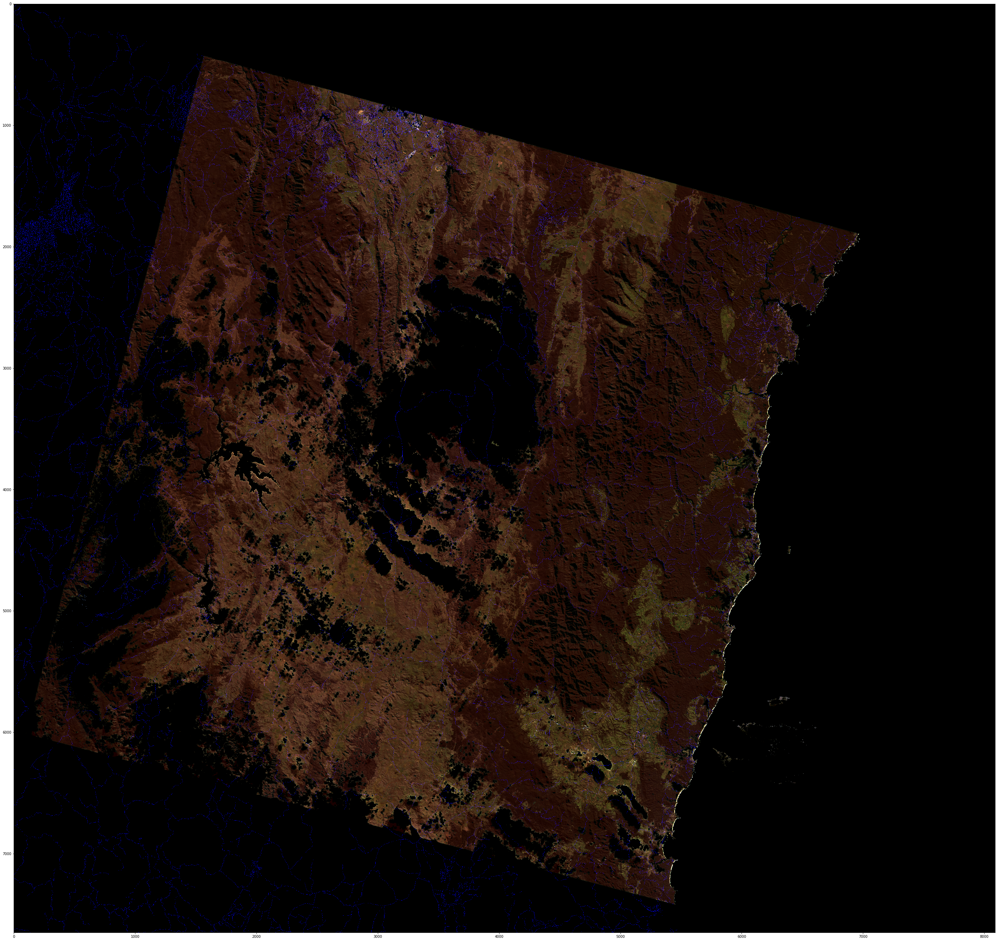

In [14]:
# pred
show_pred_prob_with_raw(train_raw_image, train_pred, train_road_mask, pred_weight=0.1, figsize=(50,50))

In [13]:
print('train pred: ')
print(train_pred.min(), train_pred.max(), train_pred.mean(), train_pred.std())

train_log_pred = -np.log(-train_pred + 1 + 1e-9)
train_norm_log_pred = (train_log_pred - train_log_pred.min()) / (train_log_pred.max()-train_log_pred.min())

print('normalized log pred: ')
print(train_norm_log_pred.min(), train_norm_log_pred.max(), 
      train_norm_log_pred.mean(), train_norm_log_pred.std())

train pred: 
0.0 1.0 0.34643288799061006 0.47583310320857075
normalized log pred: 
0.0 1.0 0.34643288799061006 0.47583310320857075


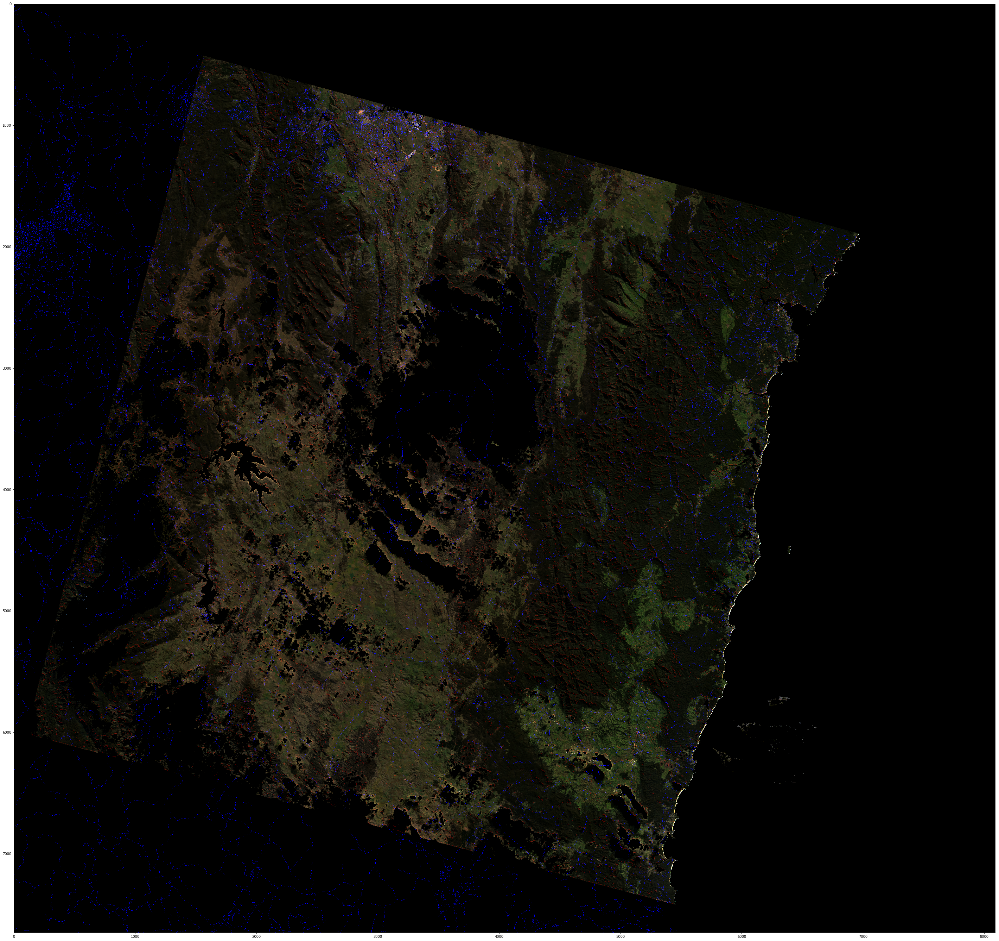

In [29]:
show_pred_prob_with_raw(train_raw_image, train_norm_log_pred, train_road_mask, pred_weight=0.3, 
                        figsize=(50,50))

CV

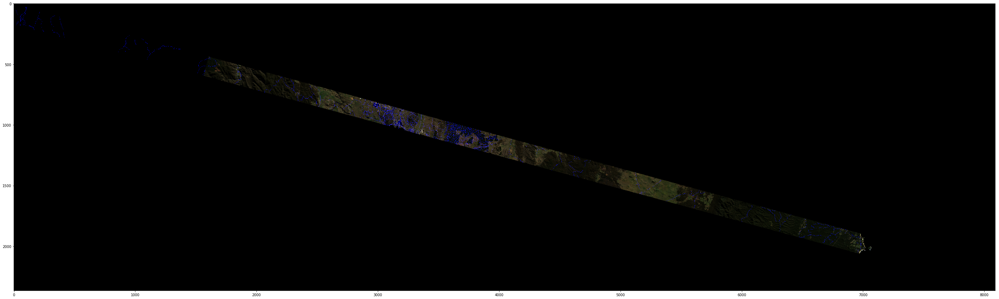

In [37]:
# pred
show_pred_prob_with_raw(CV_raw_image, CV_pred, CV_road_mask, pred_weight=0.3, figsize=(50,50))

In [32]:
# log pred
CV_log_pred = -np.log(-CV_pred + 1 + 1e-7)

print('CV_log pred: ')
print(CV_log_pred.min(), CV_log_pred.max(), CV_log_pred.mean())

CV_norm_log_pred = (CV_log_pred - CV_log_pred.min()) / (CV_log_pred.max()-CV_log_pred.min())

print('normalized log pred: ')
print(CV_norm_log_pred.min(), CV_norm_log_pred.max(), CV_norm_log_pred.mean())

CV_log pred: 
-9.999999505838704e-08 16.11809565095832 0.002530248346541866
normalized log pred: 
0.0 1.0 0.00015698804533944354


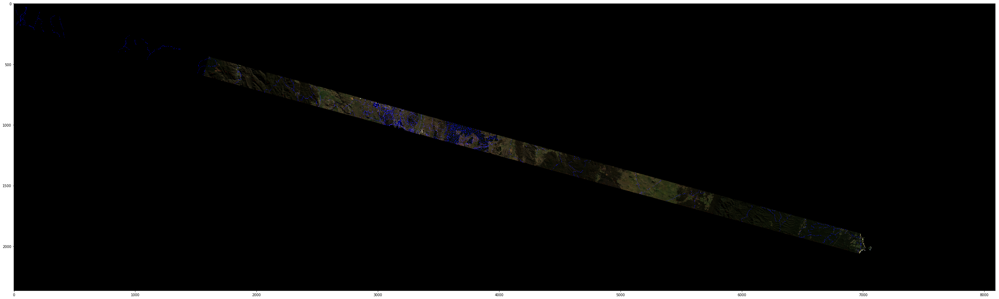

In [33]:
show_pred_prob_with_raw(CV_raw_image, CV_norm_log_pred, CV_road_mask, pred_weight=0.3, figsize=(50,50))

save plot

In [ ]:
save_path = "..."

In [ ]:
# Analyze pred in plot
show_pred_prob_with_raw(train_raw_image, train_pred_road, train_road_mask, pred_weight=0.3, figsize=(150,150), 
                        show_plot=False, save_path=save_path + 'Analysis/' + 'prob_road_on_train - 0_3.png')

show_pred_prob_with_raw(CV_raw_image, CV_pred_road, CV_road_mask, pred_weight=0.3, figsize=(150,150), 
                        show_plot=False, save_path=save_path + 'Analysis/' + 'prob_road_on_CV - 0_3.png')

In [ ]:
show_pred_prob_with_raw(CV_raw_image, CV_norm_log_pred, CV_road_mask, pred_weight=0.3, figsize=(150,150), 
                        show_plot=False, save_path=save_path + 'Analysis/' + 'log_prob_on_CV - 0_3.png')

show_pred_prob_with_raw(train_raw_image, train_norm_log_pred, train_road_mask, 
                        pred_weight=0.3, figsize=(150,150), 
                        show_plot=False, save_path=save_path + 'Analysis/' + 'log_prob_on_train - 0_3.png')

In [ ]:
# trial for FCN pred (one-hot encoding)
b[:,:,0] *=3
b[:,:,1] *=6
print(b)

np.exp(b)/np.array([np.sum(np.exp(b), axis=-1)]*b.shape[-1]).transpose(1,2,0)
np.exp(b)[:,:,1]/np.sum(np.exp(b), axis=-1)
b[:,:,1]/np.sum(b, axis=-1)

In [54]:
import math
convnet =   [[3,1,1],[2,2,0],[3,1,1],[2,2,0],[3,1,1] ,[3,1,1],[3,1,1],[3,2,0],[6,1,0], [1, 1, 0]]
layer_names = ['conv1','pool1','conv2','pool2','conv3','conv4','conv5','pool5','fc6-conv', 'fc7-conv']
imsize = 128

def outFromIn(conv, layerIn):
    n_in = layerIn[0]
    j_in = layerIn[1]
    r_in = layerIn[2]
    start_in = layerIn[3]
    k = conv[0]
    s = conv[1]
    p = conv[2]
    
    n_out = math.floor((n_in - k + 2*p)/s) + 1
    actualP = (n_out-1)*s - n_in + k 
    pR = math.ceil(actualP/2)
    pL = math.floor(actualP/2)
    
    j_out = j_in * s
    r_out = r_in + (k - 1)*j_in
    start_out = start_in + ((k-1)/2 - pL)*j_in
    return n_out, j_out, r_out, start_out
    
def printLayer(layer, layer_name):
    print(layer_name + ":")
    print("\t n features: %s \n \t jump: %s \n \t receptive size: %s \t start: %s " % (layer[0], layer[1], layer[2], layer[3]))
    
layerInfos = []
#first layer is the data layer (image) with n_0 = image size; j_0 = 1; r_0 = 1; and start_0 = 0.5
print ("-------Net summary------")

currentLayer = [imsize, 1, 1, 0.5]
printLayer(currentLayer, "input image")
for i in range(len(convnet)):
    currentLayer = outFromIn(convnet[i], currentLayer)
    layerInfos.append(currentLayer)
    printLayer(currentLayer, layer_names[i])
print ("------------------------")

layer_name = input ("Layer name where the feature in: ")
layer_idx = layer_names.index(layer_name)
idx_x = int(input ("index of the feature in x dimension (from 0)"))
idx_y = int(input ("index of the feature in y dimension (from 0)"))

n = layerInfos[layer_idx][0]
j = layerInfos[layer_idx][1]
r = layerInfos[layer_idx][2]
start = layerInfos[layer_idx][3]
assert(idx_x < n)
assert(idx_y < n)

print ("receptive field: (%s, %s)" % (r, r))
print ("center: (%s, %s)" % (start+idx_x*j, start+idx_y*j))

-------Net summary------
input image:
	 n features: 128 
 	 jump: 1 
 	 receptive size: 1 	 start: 0.5 
conv1:
	 n features: 128 
 	 jump: 1 
 	 receptive size: 3 	 start: 0.5 
pool1:
	 n features: 64 
 	 jump: 2 
 	 receptive size: 4 	 start: 1.0 
conv2:
	 n features: 64 
 	 jump: 2 
 	 receptive size: 8 	 start: 1.0 
pool2:
	 n features: 32 
 	 jump: 4 
 	 receptive size: 10 	 start: 2.0 
conv3:
	 n features: 32 
 	 jump: 4 
 	 receptive size: 18 	 start: 2.0 
conv4:
	 n features: 32 
 	 jump: 4 
 	 receptive size: 26 	 start: 2.0 
conv5:
	 n features: 32 
 	 jump: 4 
 	 receptive size: 34 	 start: 2.0 
pool5:
	 n features: 15 
 	 jump: 8 
 	 receptive size: 42 	 start: 10.0 
fc6-conv:
	 n features: 10 
 	 jump: 8 
 	 receptive size: 82 	 start: 30.0 
fc7-conv:
	 n features: 10 
 	 jump: 8 
 	 receptive size: 82 	 start: 30.0 
------------------------
Layer name where the feature in: conv3
index of the feature in x dimension (from 0)16
index of the feature in y dimension (from 0)21
r